# 0. Preparation

## 0.1. Imports

In [ ]:
import pandas as pd
import numpy as np
import requests
import io
from google.colab import drive
import re

!pip install -q "dask[dataframe]"
import dask.dataframe as dd

import tempfile
import os
!pip install -q gdown # Install gdown if not already
import gdown

from functools import reduce

import tempfile
import os
import gdown

import matplotlib.pyplot as plt
import seaborn as sns

from itertools import combinations
from math import ceil

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from sklearn.ensemble import IsolationForest

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

## 0.2. Load Data

In [ ]:
# Build the direct download URL from a file ID
def make_drive_url(file_id):
    return f"https://drive.google.com/uc?id={file_id}"

# Helper function to load a CSV from a direct URL
def load_csv_from_url(url):
    response = requests.get(url)
    response.raise_for_status()  # Raises an error if the request fails
    return pd.read_csv(io.StringIO(response.text))

# Dictionary of file IDs for clarity
file_ids = {
    "holiday_events": "1RMjSuqHXHTwAw_PGD5XVjhA3agaAGHDH",
    "items": "1ogMRixVhNY6XOJtIRtkRllyOyzw1nqya",
    "oil": "1Q59vk2v4WQ-Rpc9t2nqHcsZM3QWGFje_",
    "stores": "1Ei0MUXmNhmOcmrlPad8oklnFEDM95cDi",
    "train": "1oEX8NEJPY7wPmSJ0n7lO1JUFYyZjFBRv",
    "transactions": "1PW5LnAEAiL43fI5CRDn_h6pgDG5rtBW_"
}

# Load each CSV using the helper functions
df_holiday_events = load_csv_from_url(make_drive_url(file_ids["holiday_events"]))
df_items          = load_csv_from_url(make_drive_url(file_ids["items"]))
df_oil            = load_csv_from_url(make_drive_url(file_ids["oil"]))
df_stores         = load_csv_from_url(make_drive_url(file_ids["stores"]))
# df_train          = load_csv_from_url(make_drive_url(file_ids["train"])) we dont read it as the file is too big and wont work this way
df_transactions   = load_csv_from_url(make_drive_url(file_ids["transactions"]))

### 0.2.1. Train data

In [ ]:
train_file_id = file_ids["train"]

# Create a temporary file to store the downloaded content
# delete=False is used because dask might need to open the file multiple times
# and it will be deleted manually or by the OS on process exit.
with tempfile.NamedTemporaryFile(delete=False, mode='wb', suffix='.csv') as tmp_file:
    temp_file_path = tmp_file.name

# Use gdown to download the file directly to the temporary path
# gdown handles Google Drive's download mechanisms more robustly
gdown.download(id=train_file_id, output=temp_file_path, quiet=True)

# Now read with Dask from the local temporary file, explicitly specifying dtype for 'onpromotion'
df_train = dd.read_csv(temp_file_path, dtype={'onpromotion': float})

# It's good practice to clean up temporary files after Dask operations are complete.
# For now, we'll leave it, as subsequent cells might implicitly rely on it, but
# in a production script, consider adding `os.remove(temp_file_path)` after `df_train.compute()`
# or when df_train is no longer needed.

# 1. Data Preparation

## 1.1. Filter the train data

Since the forcast is only about Pichincha the dataset gets filtered. The holidays are just needed for national ones and the ones from the region. The forcast will be from January to March - therefor only the data form this time frame is needed. The filtering of the time frame will be later since the rest of the data is needed to fill Null values.

Since the '/' causes problems the 'BREAD/BAKERY' family gets replaced with 'BAKING'.

In [ ]:
store_numbers = df_stores[df_stores['state'] == 'Pichincha']['store_nbr']
df_train = df_train[df_train['store_nbr'].isin(store_numbers)]

# Convert 'date' column to datetime if not already for filtering by month
df_train['date'] = dd.to_datetime(df_train['date'])

df_holiday_events = df_holiday_events[df_holiday_events['locale_name'].isin(['Quito', 'Cayambe', 'Ecuador'])]

df_items.loc[df_items['family'] == 'BREAD/BAKERY', 'family'] = 'BAKING'

In [ ]:
dfs = [df_train, df_holiday_events, df_items, df_oil, df_stores, df_transactions]

## 1.2. Prepare Joining and Aggregating

In [ ]:
def join_dataframes(df_train, df_holiday_events, df_items, df_oil, df_stores, df_transactions):
    """
    Performs specific left joins onto df_train with other dataframes as requested.

    Args:
        df_train (dask.dataframe.DataFrame): The base Dask DataFrame.
        df_holiday_events (pandas.DataFrame): DataFrame for holiday events.
        df_items (pandas.DataFrame): DataFrame for items.
        df_oil (pandas.DataFrame): DataFrame for oil prices.
        df_stores (pandas.DataFrame): DataFrame for stores.
        df_transactions (pandas.DataFrame): DataFrame for transactions.

    Returns:
        dask.dataframe.DataFrame: The single resulting Dask DataFrame after all joins.
    """

    # Convert 'date' columns to datetime objects for accurate merging.
    # Note: df_train date column is initially string, others are object.
    # Ensure all are converted to datetime type for consistent merging.
    df_train_copy = df_train.copy() # Create a copy to avoid modifying the original DataFrame in place
    df_train_copy['date'] = dd.to_datetime(df_train_copy['date'])

    df_holiday_events_copy = df_holiday_events.copy()
    df_holiday_events_copy['date'] = pd.to_datetime(df_holiday_events_copy['date'])

    df_oil_copy = df_oil.copy()
    df_oil_copy['date'] = pd.to_datetime(df_oil_copy['date'])

    df_transactions_copy = df_transactions.copy()
    df_transactions_copy['date'] = pd.to_datetime(df_transactions_copy['date'])

    # Start with df_train as the base
    merged_df = df_train_copy

    # Merge df_holiday_events on 'date'
    merged_df = dd.merge(merged_df, df_holiday_events_copy, on='date', how='left')

    # Merge df_items on 'item_nbr'
    merged_df = dd.merge(merged_df, df_items, on='item_nbr', how='left')

    # Merge df_oil on 'date'
    merged_df = dd.merge(merged_df, df_oil_copy, on='date', how='left')

    # Merge df_stores on 'store_nbr'
    merged_df = dd.merge(merged_df, df_stores, on='store_nbr', how='left')

    # Merge df_transactions on 'date' and 'store_nbr'
    merged_df = dd.merge(merged_df, df_transactions_copy, on=['date', 'store_nbr'], how='left')

    return merged_df

## 1.3. Handle Outliers

In [ ]:
def handle_outliers(df, columns):
    """
    Applies outlier capping to a specified column in a DataFrame (Pandas or Dask).
    Values outside 2.5 times the IQR are capped at the calculated bounds.

    Args:
        df (pandas.DataFrame or dask.dataframe.DataFrame): The input DataFrame.
        columns (list): List of column names to process for outliers.

    Returns:
        pandas.DataFrame or dask.dataframe.DataFrame: The DataFrame with outliers capped.
    """
    for column_name in columns:
        if column_name not in df.columns:
            print(f"Warning: Column '{column_name}' not found in the DataFrame.")
            continue  # Changed from return to continue

        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df[column_name].quantile(0.25)
        Q3 = df[column_name].quantile(0.75)

        if isinstance(df, dd.DataFrame):
            # Compute quantiles to avoid building large task graphs
            Q1 = Q1.compute()
            Q3 = Q3.compute()

        # Calculate IQR
        IQR = Q3 - Q1

        # Calculate outlier bounds
        lower_bound = Q1 - 2.5 * IQR
        upper_bound = Q3 + 2.5 * IQR

        # Apply capping
        if isinstance(df, dd.DataFrame):
            # Use clip() instead of mask() - more efficient
            df[column_name] = df[column_name].clip(lower=lower_bound, upper=upper_bound)
        elif isinstance(df, pd.DataFrame):
            df.loc[df[column_name] < lower_bound, column_name] = lower_bound
            df.loc[df[column_name] > upper_bound, column_name] = upper_bound
        else:
            raise TypeError("Unsupported DataFrame type. Must be pandas.DataFrame or dask.dataframe.DataFrame.")

    return df

# 2. EDA

## 2.1. On the Full Time Frame

### 2.1.0. Fundamental Analysis

#### 2.1.0.1. Main Information about every data frame

In [ ]:
for i, df in enumerate(dfs):
    print(f"\n\n\n {i+1}. next dataframe: {[name for name, value in locals().items() if value is df][0]}")
    print(f'\n {i+1}.1 head: \n{df.head()}')
    print(f'\n {i+1}.2 info: \n{df.info()}')
    print(f'\n {i+1}.3 describe: \n{df.describe()}')
    print(f'\n {i+1}.4 shape: \n{df.shape}')
    print(f'\n {i+1}.5 isnull: \n{df.isnull().sum()}')




 1. next dataframe: df_train

 1.1 head: 
      id       date  store_nbr  item_nbr  unit_sales  onpromotion
578  578 2013-01-02          1    103665         2.0          NaN
579  579 2013-01-02          1    105574         8.0          NaN
580  580 2013-01-02          1    105575        15.0          NaN
581  581 2013-01-02          1    105577         2.0          NaN
582  582 2013-01-02          1    105737         2.0          NaN
<class 'dask.dataframe.dask_expr.DataFrame'>
Columns: 6 entries, id to onpromotion
dtypes: datetime64[ns](1), float64(5)
 1.2 info: 
None

 1.3 describe: 
Dask DataFrame Structure:
                    id    date store_nbr item_nbr unit_sales onpromotion
npartitions=1                                                           
               float64  object   float64  float64    float64     float64
                   ...     ...       ...      ...        ...         ...
Dask Name: concat, 22 expressions
Expr=Concat(frames=[((Assign(frame=Filter(frame=Arro

In [ ]:
print('Null values in df_train:')
print(df_train.isnull().sum().compute())

Null values in df_train:
id                   0
date                 0
store_nbr            0
item_nbr             0
unit_sales           0
onpromotion    9811734
dtype: int64


The column 'onpromotion' in df_train  and 'dcoilwtico' in df_oil are the only ones with null values.

#### 2.1.0.2 Unique Value Analysis

In [ ]:
for i, df_obj in enumerate(dfs):
    df_name = [name for name, value in locals().items() if value is df_obj][0]
    print(f"\n\n\n {i+1}. Unique values for dataframe: {df_name}")
    if isinstance(df_obj, dd.DataFrame):
        for col in df_obj.columns:
            unique_count = df_obj[col].nunique().compute()
            print(f"  Column '{col}': {unique_count} unique values")
    else:
        for col in df_obj.columns:
            unique_count = df_obj[col].nunique()
            print(f"  Column '{col}': {unique_count} unique values")




 1. Unique values for dataframe: df_train
  Column 'id': 54550923 unique values
  Column 'date': 1679 unique values
  Column 'store_nbr': 19 unique values
  Column 'item_nbr': 4033 unique values
  Column 'unit_sales': 218854 unique values
  Column 'onpromotion': 2 unique values



 2. Unique values for dataframe: df_holiday_events
  Column 'date': 187 unique values
  Column 'type': 6 unique values
  Column 'locale': 2 unique values
  Column 'locale_name': 3 unique values
  Column 'description': 76 unique values
  Column 'transferred': 2 unique values



 3. Unique values for dataframe: df_items
  Column 'item_nbr': 4100 unique values
  Column 'family': 33 unique values
  Column 'class': 337 unique values
  Column 'perishable': 2 unique values



 4. Unique values for dataframe: df_oil
  Column 'date': 1218 unique values
  Column 'dcoilwtico': 998 unique values



 5. Unique values for dataframe: df_stores
  Column 'store_nbr': 54 unique values
  Column 'city': 22 unique values
  Col

In [ ]:
dataframes_to_process = {
    "df_train": ['store_nbr', 'onpromotion'],
    "df_holiday_events": ['type', 'locale', 'locale_name', 'transferred'],
    "df_items": ['family', 'perishable'],
    "df_stores": ['store_nbr', 'city', 'state', 'type', 'cluster'],
    "df_transactions": ['store_nbr']
}

# Map dataframe names (strings) to their actual objects
df_objects = {
    "df_train": df_train,
    "df_holiday_events": df_holiday_events,
    "df_items": df_items,
    "df_oil": df_oil,
    "df_stores": df_stores,
    "df_transactions": df_transactions
}

for df_name, columns in dataframes_to_process.items():
    df_obj = df_objects.get(df_name)
    print(f"\nUnique values for dataframe: {df_name}")
    for col in columns:
        if isinstance(df_obj, dd.DataFrame):
            unique_values = df_obj[col].unique().compute()
        else:
            unique_values = df_obj[col].unique()
        print(f"  Column '{col}': {unique_values}")


Unique values for dataframe: df_train
  Column 'store_nbr': 0     3
1     7
0     2
0    20
0     1
0    47
0    18
0    44
0    46
0     4
0    10
0     9
0     8
0    45
0    49
0    48
0    11
0    17
0     6
Name: store_nbr, dtype: int64
  Column 'onpromotion': 0    1.0
0    0.0
0    NaN
Name: onpromotion, dtype: float64

Unique values for dataframe: df_holiday_events
  Column 'type': ['Holiday' 'Transfer' 'Additional' 'Bridge' 'Work Day' 'Event']
  Column 'locale': ['Local' 'National']
  Column 'locale_name': ['Cayambe' 'Ecuador' 'Quito']
  Column 'transferred': [False  True]

Unique values for dataframe: df_items
  Column 'family': ['GROCERY I' 'CLEANING' 'BAKING' 'DELI' 'POULTRY' 'EGGS' 'PERSONAL CARE'
 'LINGERIE' 'BEVERAGES' 'AUTOMOTIVE' 'DAIRY' 'GROCERY II' 'MEATS'
 'FROZEN FOODS' 'HOME APPLIANCES' 'SEAFOOD' 'PREPARED FOODS'
 'LIQUOR,WINE,BEER' 'BEAUTY' 'HARDWARE' 'LAWN AND GARDEN' 'PRODUCE'
 'HOME AND KITCHEN II' 'HOME AND KITCHEN I' 'MAGAZINES' 'HOME CARE'
 'PET SUPPLIES' '

#### 2.1.0.3. Filling Null Values

Assuming 'onpromotion' null values are not on promotion the null values will get filled with 0 and 'dcoilwtico' null values are null because of weekends or holidays at the stock market. Therefor they will get filled with the last not null value.

In [ ]:
df_train['onpromotion'] = df_train['onpromotion'].fillna(0)
df_oil['dcoilwtico'] = df_oil['dcoilwtico'].ffill()

In [ ]:
for df_name, df_obj in df_objects.items():
    print(f'Null values in {df_name}:')
    if isinstance(df_obj, dd.DataFrame):
      print(df_obj.isnull().sum().compute())
    else:
      print(df_obj.isnull().sum())

Null values in df_train:
id             0
date           0
store_nbr      0
item_nbr       0
unit_sales     0
onpromotion    0
dtype: int64
Null values in df_holiday_events:
date           0
type           0
locale         0
locale_name    0
description    0
transferred    0
dtype: int64
Null values in df_items:
item_nbr      0
family        0
class         0
perishable    0
dtype: int64
Null values in df_oil:
date          0
dcoilwtico    1
dtype: int64
Null values in df_stores:
store_nbr    0
city         0
state        0
type         0
cluster      0
dtype: int64
Null values in df_transactions:
date            0
store_nbr       0
transactions    0
dtype: int64


#### 2.1.0.4. Merging the Data Frame

##### 2.1.0.4.0. The Join

In [ ]:
# The function is created like this: join_dataframes(df_train, df_holiday_events, df_items, df_oil, df_stores, df_transactions)
# dfs is created like this: dfs = [df_train, df_holiday_events, df_items, df_oil, df_stores, df_transactions]
df_complete = join_dataframes(dfs[0], dfs[1], dfs[2], dfs[3], dfs[4], dfs[5])

columns_to_drop = ['id', 'store_nbr', 'locale_name', 'description', 'state']
df_complete = df_complete.drop(columns=columns_to_drop)

/usr/local/lib/python3.12/dist-packages/dask/dataframe/multi.py:169: UserWarning: Merging dataframes with merge column data type mismatches: 
+--------------------------+------------+-------------+
| Merge columns            | left dtype | right dtype |
+--------------------------+------------+-------------+
| ('item_nbr', 'item_nbr') | float64    | int64       |
+--------------------------+------------+-------------+
Cast dtypes explicitly to avoid unexpected results.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/dask/dataframe/multi.py:169: UserWarning: Merging dataframes with merge column data type mismatches: 
+----------------------------+------------+-------------+
| Merge columns              | left dtype | right dtype |
+----------------------------+------------+-------------+
| ('store_nbr', 'store_nbr') | float64    | int64       |
+----------------------------+------------+-------------+
Cast dtypes explicitly to avoid unexpected results.
  warnings.warn(
/usr/loc

##### 2.1.0.4.1. Null values for the Joined Data Frame

In [ ]:
print('Null values in df_complete:')
null_counts = df_complete.isnull().sum().compute()
print(null_counts)

print('\nFirst 10 rows with null values per column:')
for column in null_counts.index:
    if null_counts[column] > 0:
        null_rows = df_complete[df_complete[column].isnull()]
        print(null_rows.head(10))

Null values in df_complete:
date                   0
item_nbr               0
unit_sales             0
onpromotion            0
type_x          49319718
locale          49319718
transferred     49319718
family                 0
class                  0
perishable             0
dcoilwtico      16374860
city                   0
type_y                 0
cluster                0
transactions      105700
dtype: int64

First 10 rows with null values per column:
        date  item_nbr  unit_sales  onpromotion type_x locale transferred  \
0 2013-01-02    103665         2.0          0.0   <NA>   <NA>         NaN   
1 2013-01-02    105574         8.0          0.0   <NA>   <NA>         NaN   
2 2013-01-02    105575        15.0          0.0   <NA>   <NA>         NaN   
3 2013-01-02    105577         2.0          0.0   <NA>   <NA>         NaN   
4 2013-01-02    105737         2.0          0.0   <NA>   <NA>         NaN   
5 2013-01-02    105857        12.0          0.0   <NA>   <NA>         NaN   
6

/usr/local/lib/python3.12/dist-packages/dask/dataframe/core.py:382: UserWarning: Insufficient elements for `head`. 10 elements requested, only 0 elements available. Try passing larger `npartitions` to `head`.
  warnings.warn(


Most Null values come from the holidy data frame. Since the data frame got filtered for the regional holidays the null values are most likely normal work days in the region analyzed here.
For transactions it is assumed that not included dates are dates without transactions.
Missing Oil prices get again filled with the last known value.


In [ ]:
df_complete['type_x'] = df_complete['type_x'].fillna('Work Day')
df_complete['locale'] = df_complete['locale'].fillna('National')
df_complete['transferred'] = df_complete['transferred'].fillna(False)

df_complete['dcoilwtico'] = df_complete['dcoilwtico'].ffill()
df_complete['transactions'] = df_complete['transactions'].fillna(0)

##### 2.1.0.4.2. Apply Threshold to Outliers

In [ ]:
columns = ['unit_sales', 'transactions']
df_complete = handle_outliers(df_complete, columns)

##### 2.1.0.4.3. Create Features

In [ ]:
df_complete['day_of_week'] = df_complete['date'].dt.dayofweek
df_complete['day_of_month'] = df_complete['date'].dt.day
df_complete['day_month'] = df_complete['date'].dt.strftime('%m-%d')

##### 2.1.0.4.4. Parse Values in Joined Data Frame and sample

In [ ]:
# List of columns that are explicitly categorical strings and should NOT be converted to numeric
# These were identified as string type and containing non-numeric values in the earlier type analysis
categorical_string_columns = [
    'type_x', 'locale', 'locale_name', 'description', 'family',
    'city', 'state', 'type_y'
]

# Convert all suitable columns to numeric in a Dask-compatible way
for col in df_complete.columns:
    # Skip datetime columns and explicitly categorical string columns
    if df_complete[col].dtype == 'datetime64[ns]' or col in categorical_string_columns:
        continue

    # Attempt to convert other columns to numeric.
    # This will convert columns that might be 'object' or 'string' but contain numbers,
    # or it will coerce non-numeric values to NaN, changing the dtype to float.
    # The crucial part is NOT doing this for known categorical string columns.
    df_complete[col] = dd.to_numeric(df_complete[col], errors='coerce')

# Find the total number of rows (requires computation)
total_rows = df_complete.shape[0].compute()

# Calculate the fraction needed to get 100,000 rows
desired_rows = 1_000
frac = min(desired_rows / total_rows, 1.0)

# Sample the Dask DataFrame to get a Pandas DataFrame
df = df_complete.sample(frac=frac, random_state=42).compute().reset_index(drop=True)

# Ensure 'date' column is explicitly of datetime type in the sampled Pandas DataFrame `df`
# This is crucial for subsequent time-series plots.
df['date'] = pd.to_datetime(df['date'])

# Ensure categorical columns that were skipped from numeric conversion are of 'category' dtype for plotting
for col in categorical_string_columns:
    if col in df.columns:
        df[col] = df[col].astype('category')

In [ ]:
print(df.columns)

Index(['date', 'item_nbr', 'unit_sales', 'onpromotion', 'type_x', 'locale',
       'transferred', 'family', 'class', 'perishable', 'dcoilwtico', 'city',
       'type_y', 'cluster', 'transactions', 'day_of_week', 'day_of_month',
       'day_month'],
      dtype='object')


### 2.1.1. Univariante Analysis

#### 2.1.1.1. Histogram

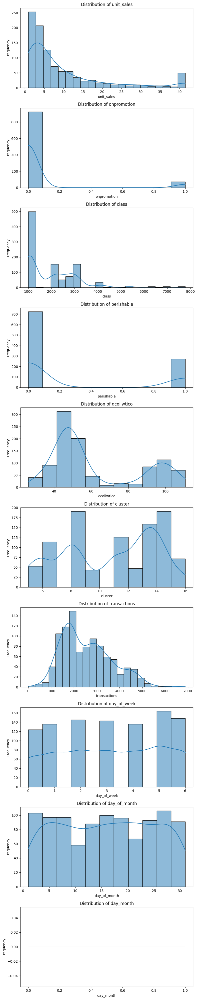

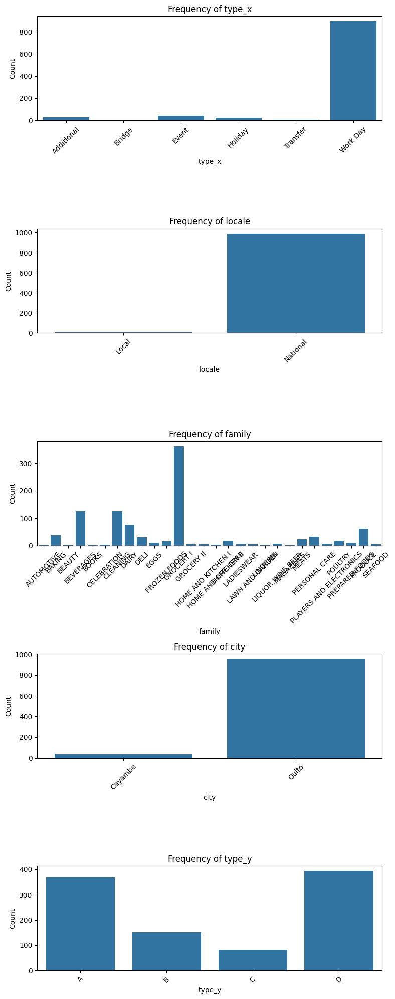

In [ ]:
numerical_columns = df.select_dtypes(include=['number']).columns
categorical_columns = df.select_dtypes(include=['category']).columns

# Exclude columns containing the '_id' wildcard and specific identifier columns
columns_to_exclude = ['id', 'item_nbr', 'store_nbr']
numerical_columns = [
    column for column in numerical_columns if '_id' not in column and column not in columns_to_exclude
]

# Create subplots for numerical columns (histograms)
fig_numerical, axes_numerical = plt.subplots(len(numerical_columns), 1, figsize=(8, len(numerical_columns)*4))

for i, numerical in enumerate(numerical_columns):
    ax = axes_numerical[i] if len(numerical_columns) > 1 else axes_numerical
    sns.histplot(data=df, x=numerical, kde=True, ax=ax)
    ax.set_title(f'Distribution of {numerical}')
    ax.set_xlabel(numerical)
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

# Create subplots for categorical columns (count plots)
fig_categorical, axes_categorical = plt.subplots(len(categorical_columns), 1, figsize=(8, len(categorical_columns)*4))

for i, categorical in enumerate(categorical_columns):
    ax = axes_categorical[i] if len(categorical_columns) > 1 else axes_categorical
    sns.countplot(data=df, x=categorical, ax=ax)
    ax.set_title(f'Frequency of {categorical}')
    ax.set_xlabel(categorical)
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=45) # Rotate labels for better readability

plt.tight_layout()
plt.show()

#### 2.1.1.2. Box and Violin Plots

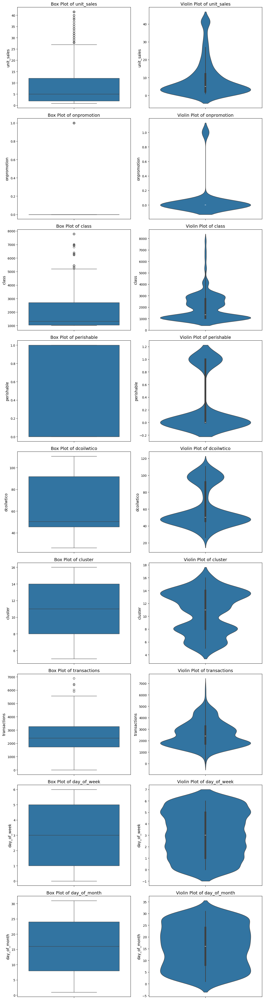

In [ ]:
# Filter numerical columns to exclude those with all NaN values in the sampled df
numerical_columns_to_plot = [col for col in numerical_columns if not df[col].dropna().empty]

num_numerical_to_plot = len(numerical_columns_to_plot)

if num_numerical_to_plot == 0:
    print("No numerical columns with valid (non-NaN) data found for box and violin plots after filtering.")
else:
    # Create subplots: num_numerical_to_plot rows, 2 columns (one for box, one for violin)
    # The total figure height scales with the number of plots.
    fig, axes = plt.subplots(
        nrows=num_numerical_to_plot,
        ncols=2,
        figsize=(12, num_numerical_to_plot * 5),
        squeeze=False  # Ensures 'axes' is always a 2D array, even with one row
    )

    # 3. Loop and plot
    for i, numerical in enumerate(numerical_columns_to_plot):
        # --- Box Plot (in the first column of the current row) ---
        ax_box = axes[i, 0]  # Correct index: row 'i', column 0
        sns.boxplot(data=df, y=numerical, ax=ax_box)
        ax_box.set_title(f'Box Plot of {numerical}', fontsize=14)
        ax_box.set_ylabel(numerical, fontsize=12)
        ax_box.set_xlabel('') # Clear the x-label as there is no category

        # --- Violin Plot (in the second column of the current row) ---
        ax_violin = axes[i, 1]  # Correct index: row 'i', column 1
        sns.violinplot(data=df, y=numerical, ax=ax_violin)
        ax_violin.set_title(f'Violin Plot of {numerical}', fontsize=14)
        ax_violin.set_ylabel(numerical, fontsize=12)
        ax_violin.set_xlabel('') # Clear the x-label as there is no category

    # 4. Final adjustments
    plt.tight_layout()
    plt.show()

#### 2.1.1.3. Line Graphs

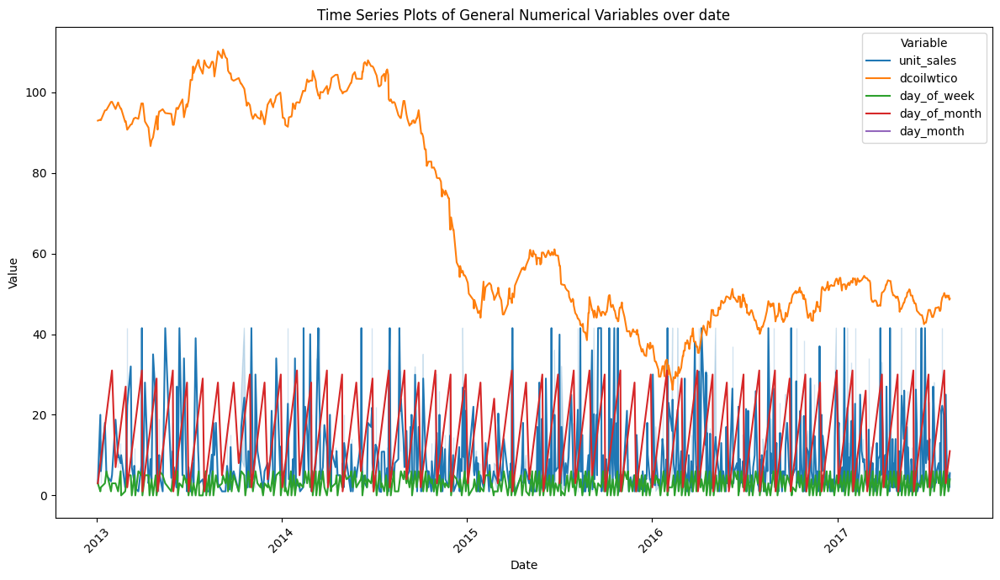

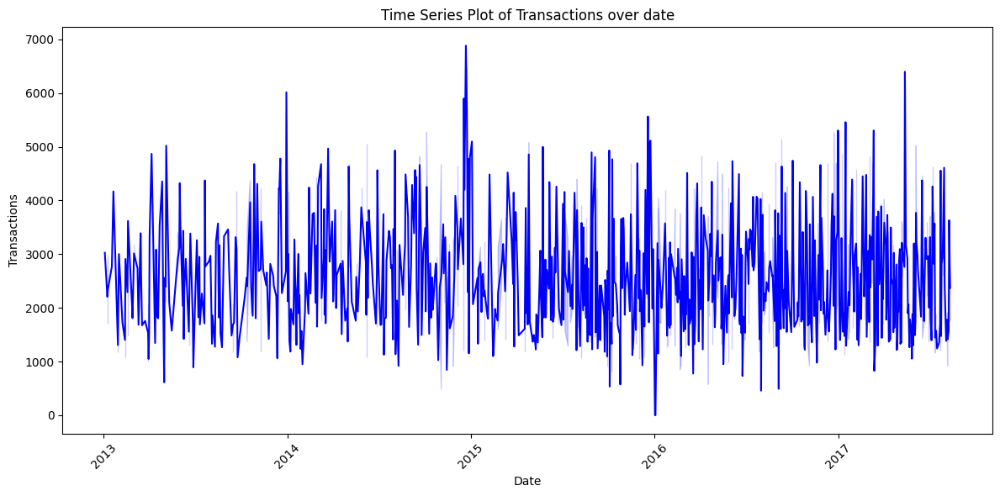

In [ ]:
time_column = None
# List of common time-related column names, from largest to smallest granularity
priority_time_columns = [
    'datetime', 'date', 'timestamp', 'time'
]
split_time = [
    'year', 'month', 'day', 'hour', 'minute', 'second', 'millisecond'
]

# Automatically detect the time column if not specified

for col in priority_time_columns:
  if col in df.columns:
    time_column = col

# Ensure the detected time column is of a datetime type for proper plotting
# This conversion can handle various string formats
df[time_column] = pd.to_datetime(df[time_column])

# Define columns to exclude from the main line plot
columns_to_exclude_from_general_plot = ['onpromotion', 'class', 'perishable', 'cluster', 'transactions']

# Filter numerical columns for the general line plot
numerical_columns_for_general_plot = [
    col for col in numerical_columns if col not in columns_to_exclude_from_general_plot
]

# Melt the DataFrame to long format for easier plotting with seaborn for general variables
if numerical_columns_for_general_plot:
    df_long_general = df.melt(id_vars=[time_column], value_vars=numerical_columns_for_general_plot,
                              var_name='Variable', value_name='Value')

    # Create the general line plot
    plt.figure(figsize=(12, 7)) # A more standard and professional figure size
    sns.lineplot(data=df_long_general, x=time_column, y='Value', hue='Variable', palette='tab10')

    # Add titles and labels
    plt.title(f'Time Series Plots of General Numerical Variables over {time_column}')
    plt.xlabel(time_column.title()) # Capitalize the first letter for a cleaner look
    plt.ylabel('Value')

    # Improve layout
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
else:
    print("No general numerical columns left to plot after exclusion.")

# Create a separate line plot for 'transactions'
if 'transactions' in df.columns:
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df, x=time_column, y='transactions', color='blue')
    plt.title(f'Time Series Plot of Transactions over {time_column}')
    plt.xlabel(time_column.title())
    plt.ylabel('Transactions')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
else:
    print("The 'transactions' column was not found in the DataFrame.")

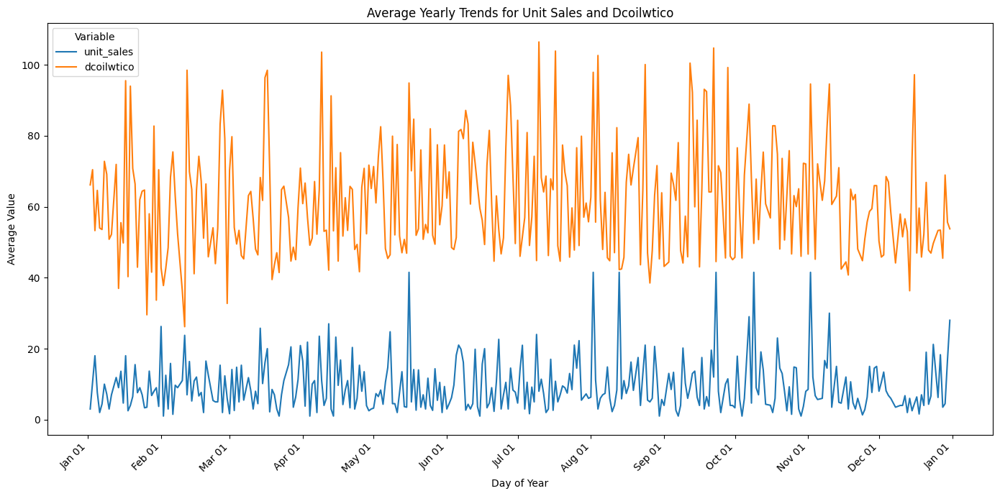

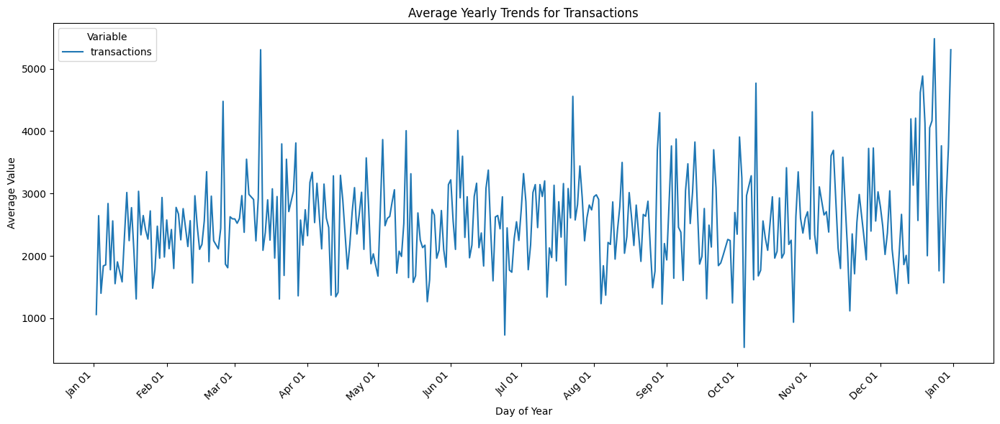

In [ ]:
# Ensure 'date' column is datetime type
df['date'] = pd.to_datetime(df['date'])

# Extract month and day to represent a common 'day of year'
# We'll create a new column that effectively represents the day-of-year without the year itself
# One way to do this is to create a dummy date for all years, e.g., year 2000
df['day_month'] = df['date'].dt.strftime('%m-%d')

# Define the numerical columns for which to plot the average year trend
numerical_cols_for_average_general = ['unit_sales', 'dcoilwtico']
numerical_cols_for_average_transactions = ['transactions']

# Group by day_month and calculate the mean for the selected numerical columns
df_average_year = df.groupby('day_month')[numerical_cols_for_average_general + numerical_cols_for_average_transactions].mean().reset_index()

# Convert 'day_month' back to a datetime object for proper sorting on the x-axis
# Use a dummy year (e.g., 2000) to create a sortable date
df_average_year['date_for_sort'] = pd.to_datetime('2000-' + df_average_year['day_month'])

# Sort by this new date column
df_average_year = df_average_year.sort_values('date_for_sort')

# --- Plot for unit_sales and dcoilwtico ---
# Melt the DataFrame for unit_sales and dcoilwtico
df_average_year_long_general = df_average_year.melt(
    id_vars=['date_for_sort'],
    value_vars=numerical_cols_for_average_general,
    var_name='Variable',
    value_name='Average Value'
)

plt.figure(figsize=(14, 7))
sns.lineplot(data=df_average_year_long_general, x='date_for_sort', y='Average Value', hue='Variable', palette='tab10')

plt.title('Average Yearly Trends for Unit Sales and Dcoilwtico')
plt.xlabel('Day of Year')
plt.ylabel('Average Value')

import matplotlib.dates as mdates
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

# --- Plot for transactions ---
# Melt the DataFrame for transactions
df_average_year_long_transactions = df_average_year.melt(
    id_vars=['date_for_sort'],
    value_vars=numerical_cols_for_average_transactions,
    var_name='Variable',
    value_name='Average Value'
)

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_average_year_long_transactions, x='date_for_sort', y='Average Value', hue='Variable', palette='tab10')

plt.title('Average Yearly Trends for Transactions')
plt.xlabel('Day of Year')
plt.ylabel('Average Value')

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

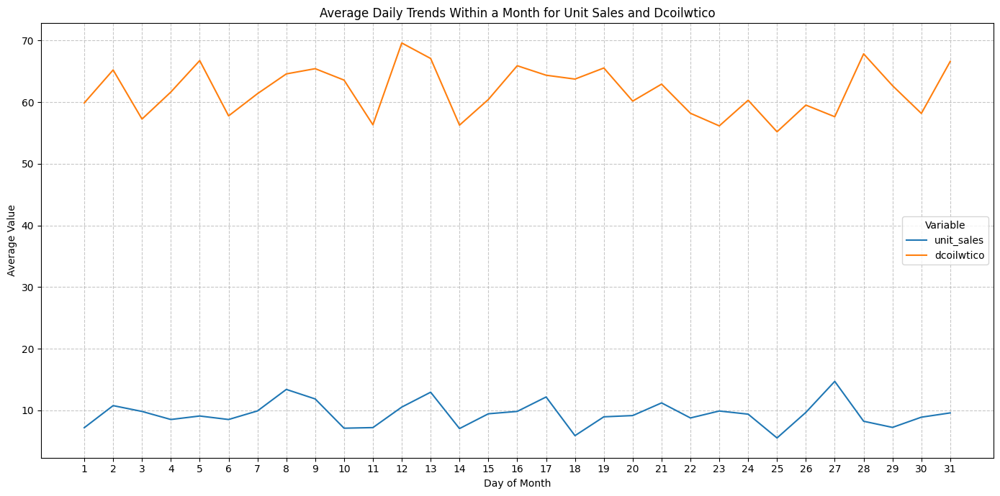

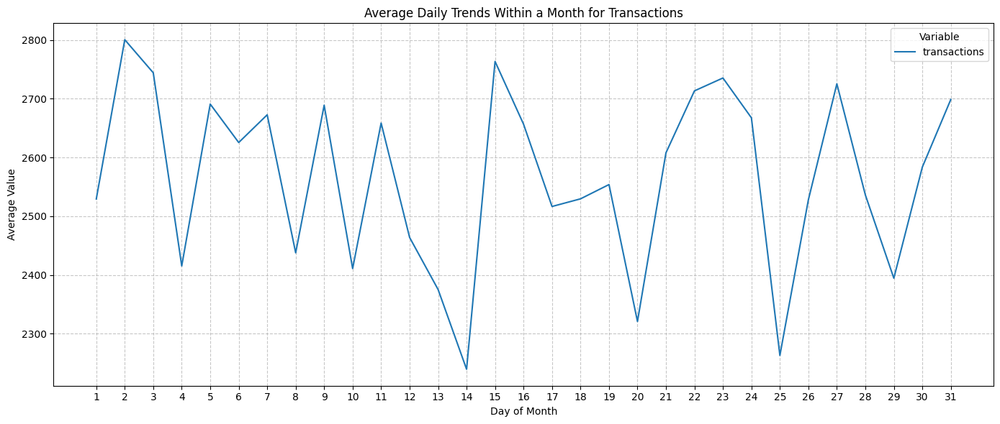

In [ ]:
# Define the numerical columns for which to plot the average day-of-month trend
numerical_cols_for_average_general_day_of_month = ['unit_sales', 'dcoilwtico']
numerical_cols_for_average_transactions_day_of_month = ['transactions']

# Group by day_of_month and calculate the mean for the selected numerical columns
df_average_day_of_month = df.groupby('day_of_month')[numerical_cols_for_average_general_day_of_month + numerical_cols_for_average_transactions_day_of_month].mean().reset_index()

# --- Plot for unit_sales and dcoilwtico (average day of month) ---
# Melt the DataFrame for unit_sales and dcoilwtico
df_average_day_of_month_long_general = df_average_day_of_month.melt(
    id_vars=['day_of_month'],
    value_vars=numerical_cols_for_average_general_day_of_month,
    var_name='Variable',
    value_name='Average Value'
)

plt.figure(figsize=(14, 7))
sns.lineplot(data=df_average_day_of_month_long_general, x='day_of_month', y='Average Value', hue='Variable', palette='tab10')

plt.title('Average Daily Trends Within a Month for Unit Sales and Dcoilwtico')
plt.xlabel('Day of Month')
plt.ylabel('Average Value')
plt.xticks(range(1, 32)) # Assuming a max of 31 days in a month
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# --- Plot for transactions (average day of month) ---
# Melt the DataFrame for transactions
df_average_day_of_month_long_transactions = df_average_day_of_month.melt(
    id_vars=['day_of_month'],
    value_vars=numerical_cols_for_average_transactions_day_of_month,
    var_name='Variable',
    value_name='Average Value'
)

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_average_day_of_month_long_transactions, x='day_of_month', y='Average Value', hue='Variable', palette='tab10')

plt.title('Average Daily Trends Within a Month for Transactions')
plt.xlabel('Day of Month')
plt.ylabel('Average Value')
plt.xticks(range(1, 32)) # Assuming a max of 31 days in a month
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

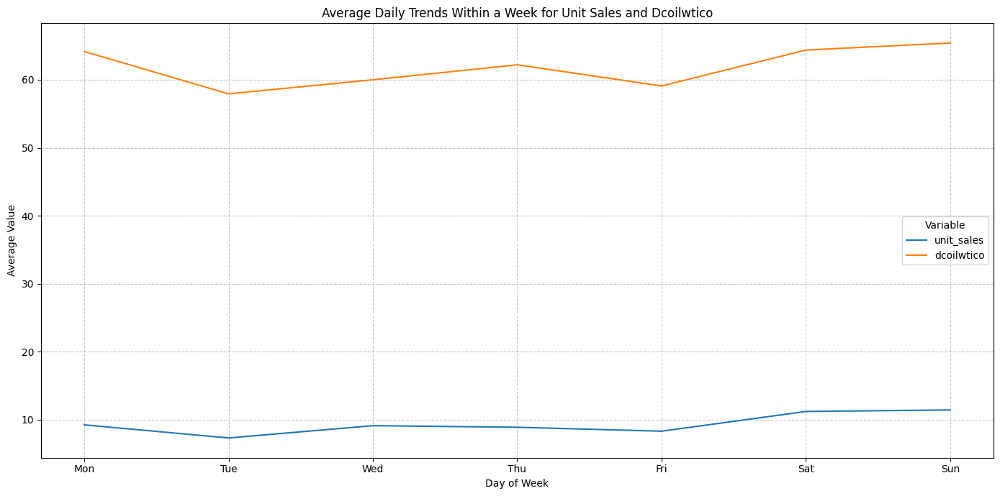

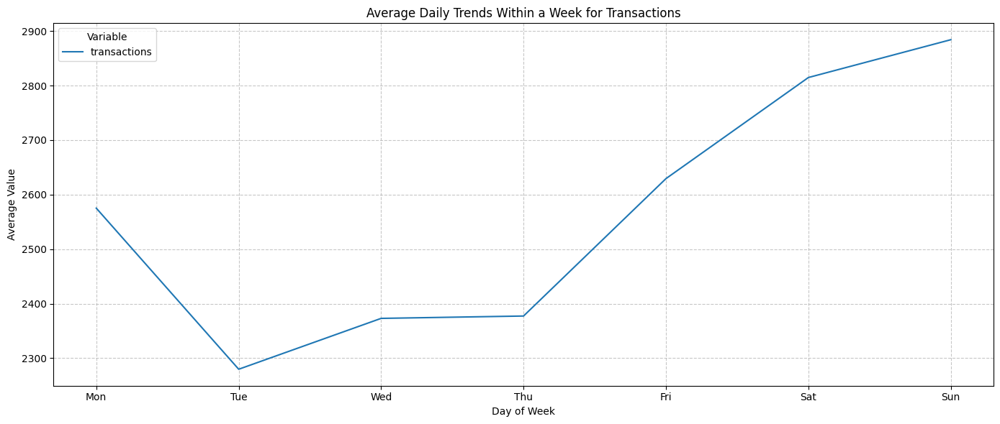

In [ ]:
# Define the numerical columns for which to plot the average day-of-week trend
numerical_cols_for_average_general_day_of_week = ['unit_sales', 'dcoilwtico']
numerical_cols_for_average_transactions_day_of_week = ['transactions']

# Group by day_of_week and calculate the mean for the selected numerical columns
df_average_day_of_week = df.groupby('day_of_week')[numerical_cols_for_average_general_day_of_week + numerical_cols_for_average_transactions_day_of_week].mean().reset_index()

# --- Plot for unit_sales and dcoilwtico (average day of week) ---
# Melt the DataFrame for unit_sales and dcoilwtico
df_average_day_of_week_long_general = df_average_day_of_week.melt(
    id_vars=['day_of_week'],
    value_vars=numerical_cols_for_average_general_day_of_week,
    var_name='Variable',
    value_name='Average Value'
)

plt.figure(figsize=(14, 7))
sns.lineplot(data=df_average_day_of_week_long_general, x='day_of_week', y='Average Value', hue='Variable', palette='tab10')

plt.title('Average Daily Trends Within a Week for Unit Sales and Dcoilwtico')
plt.xlabel('Day of Week')
plt.ylabel('Average Value')
plt.xticks(range(7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# --- Plot for transactions (average day of week) ---
# Melt the DataFrame for transactions
df_average_day_of_week_long_transactions = df_average_day_of_week.melt(
    id_vars=['day_of_week'],
    value_vars=numerical_cols_for_average_transactions_day_of_week,
    var_name='Variable',
    value_name='Average Value'
)

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_average_day_of_week_long_transactions, x='day_of_week', y='Average Value', hue='Variable', palette='tab10')

plt.title('Average Daily Trends Within a Week for Transactions')
plt.xlabel('Day of Week')
plt.ylabel('Average Value')
plt.xticks(range(7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 2.1.2. Bivariate Analysis

#### 2.1.2.1. Scatter PLots

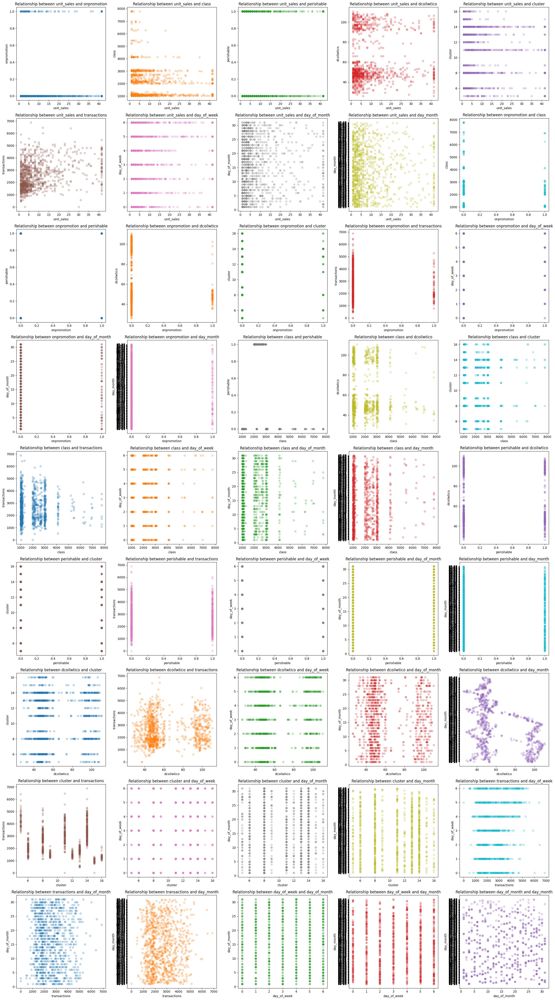

In [ ]:
numerical_df = df.select_dtypes(include=np.number)

# Filter for the relevant columns
relevant_columns = ['unit_sales', 'onpromotion', 'perishable', 'dcoilwtico', 'transactions']
numerical_df = numerical_df[relevant_columns]

column_pairs = list(combinations(numerical_columns, 2))

fig, axes = plt.subplots(ceil(len(column_pairs)/5), 5, figsize=(25, 5*ceil(len(column_pairs)/5)))
axes_flat = axes.flatten()

colors = sns.color_palette('tab10', len(column_pairs))

# Loop through each subplot axis and the corresponding column pair
# zip() is a concise way to iterate over both lists at the same time
for ax, (col1, col2), color in zip(axes_flat, column_pairs, colors):
    ax.scatter(df[col1], df[col2], alpha=0.25, color=color)

    ax.set_xlabel(col1)
    ax.set_ylabel(col2)
    ax.set_title(f"Relationship between {col1} and {col2}")

plt.tight_layout()
plt.show()

#### 2.1.2.2. Correlation Matrix

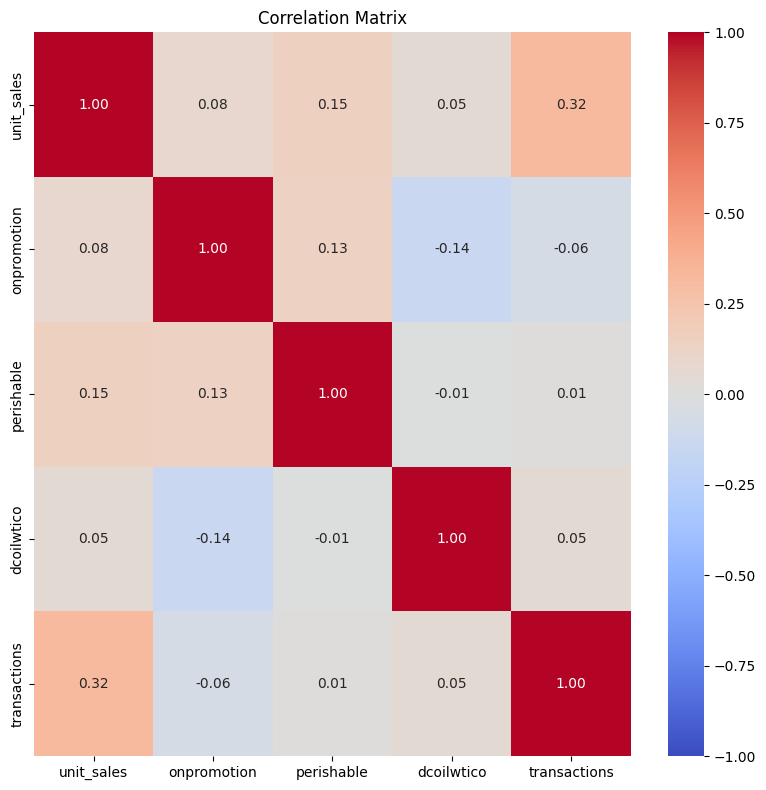


Correlation Matrix:


,unit_sales,onpromotion,perishable,dcoilwtico,transactions
unit_sales,1.000000,0.080228,0.148847,0.048407,0.317407
onpromotion,0.080228,1.000000,0.134244,-0.142372,-0.060162
perishable,0.148847,0.134244,1.000000,-0.005085,0.007998
dcoilwtico,0.048407,-0.142372,-0.005085,1.000000,0.048112
transactions,0.317407,-0.060162,0.007998,0.048112,1.000000


In [ ]:
corr = numerical_df.corr()
plt.figure(figsize=(8, 8))

# Calculate the maximum absolute correlation value to set symmetric vmin and vmax
max_abs_corr = np.max(np.abs(corr.values))

sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10},
            vmin=-max_abs_corr, vmax=max_abs_corr, center=0)

plt.title('Correlation Matrix')
plt.tight_layout()

plt.show()

print("\nCorrelation Matrix:")
display(corr)

#### 2.1.2.3. Box and Violin Plots over category

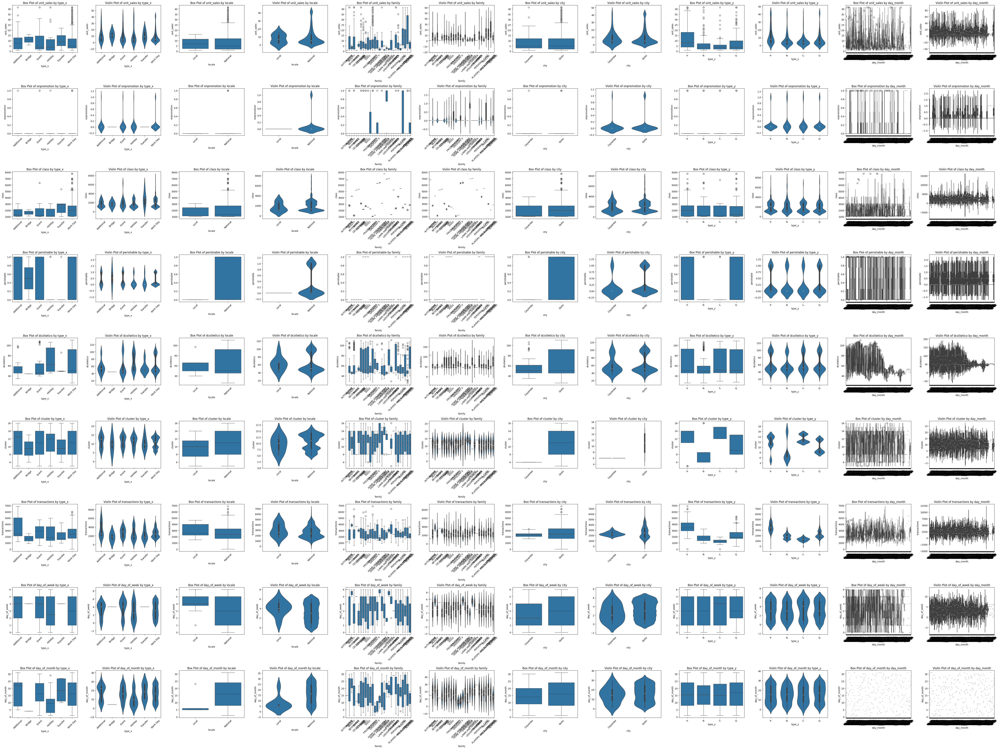

In [ ]:
categorical_columns = df.select_dtypes(include=['object', 'category']).columns

categorical_columns = [
    column for column in categorical_columns if '_id' not in column
]

# Re-define numerical_columns for consistency with previous plots and to exclude identifiers
numerical_columns_for_bivariate = df.select_dtypes(include=['number']).columns
columns_to_exclude_bivariate = ['id', 'item_nbr', 'store_nbr']
numerical_columns_for_bivariate = [
    column for column in numerical_columns_for_bivariate if '_id' not in column and column not in columns_to_exclude_bivariate
]
# Filter to ensure they have at least one non-NaN value somewhere in the df
numerical_columns_for_bivariate = [col for col in numerical_columns_for_bivariate if not df[col].dropna().empty]

num_numerical = len(numerical_columns_for_bivariate)
num_categorical = len(categorical_columns)

if num_numerical == 0 or num_categorical == 0:
    print("No numerical or categorical columns found for box and violin plots.")
else:
    fig, axes = plt.subplots(num_numerical, num_categorical * 2, figsize=(num_categorical * 10, num_numerical * 5), squeeze=False)

    for i, numerical in enumerate(numerical_columns_for_bivariate):
        for j, category in enumerate(categorical_columns):
            # Filter data to only include rows where both numerical and categorical columns have non-null values
            plot_data = df.dropna(subset=[numerical, category])

            if not plot_data.empty:
                # Box plot
                ax_box = axes[i, j * 2]
                sns.boxplot(data=plot_data, x=category, y=numerical, ax=ax_box)
                ax_box.set_title(f'Box Plot of {numerical} by {category}')
                ax_box.set_xlabel(category)
                ax_box.set_ylabel(numerical)
                ax_box.tick_params(axis='x', rotation=45)

                # Violin plot
                ax_violin = axes[i, j * 2 + 1]
                sns.violinplot(data=plot_data, x=category, y=numerical, ax=ax_violin)
                ax_violin.set_title(f'Violin Plot of {numerical} by {category}')
                ax_violin.set_xlabel(category)
                ax_violin.set_ylabel(numerical)
                ax_violin.tick_params(axis='x', rotation=45)
            else:
                # If no valid data for plotting this pair, display a message instead of an empty plot
                ax_box = axes[i, j * 2]
                ax_box.axis('off')
                ax_box.text(0.5, 0.5, f'No valid data for {numerical} by {category}',
                            horizontalalignment='center', verticalalignment='center', transform=ax_box.transAxes)

                ax_violin = axes[i, j * 2 + 1]
                ax_violin.axis('off')
                ax_violin.text(0.5, 0.5, f'No valid data for {numerical} by {category}',
                               horizontalalignment='center', verticalalignment='center', transform=ax_violin.transAxes)

    plt.tight_layout()
    plt.show()

## 2.2. On the needed Time Frame (Jan - Mar)

### 2.2.0. Filter the time frame

In [ ]:
# Filter data to include only the first quarter (January to March) of each year
df_complete = df_complete[df_complete['date'].dt.month.between(1, 3)]

#### 2.2.0.1. Sample the Data

In [ ]:
# List of columns that are explicitly categorical strings and should NOT be converted to numeric
# These were identified as string type and containing non-numeric values in the earlier type analysis
categorical_string_columns = [
    'type_x', 'locale', 'locale_name', 'description', 'family',
    'city', 'state', 'type_y'
]

# Convert all suitable columns to numeric in a Dask-compatible way
for col in df_complete.columns:
    # Skip datetime columns and explicitly categorical string columns
    if df_complete[col].dtype == 'datetime64[ns]' or col in categorical_string_columns:
        continue

    # Attempt to convert other columns to numeric.
    # This will convert columns that might be 'object' or 'string' but contain numbers,
    # or it will coerce non-numeric values to NaN, changing the dtype to float.
    # The crucial part is NOT doing this for known categorical string columns.
    df_complete[col] = dd.to_numeric(df_complete[col], errors='coerce')

# Find the total number of rows (requires computation)
total_rows = df_complete.shape[0].compute()

# Calculate the fraction needed to get 100,000 rows
desired_rows = 1_000
frac = min(desired_rows / total_rows, 1.0)

# Sample the Dask DataFrame to get a Pandas DataFrame
df = df_complete.sample(frac=frac, random_state=42).compute().reset_index(drop=True)

# Ensure 'date' column is explicitly of datetime type in the sampled Pandas DataFrame `df`
# This is crucial for subsequent time-series plots.
df['date'] = pd.to_datetime(df['date'])

# Ensure categorical columns that were skipped from numeric conversion are of 'category' dtype for plotting
for col in categorical_string_columns:
    if col in df.columns:
        df[col] = df[col].astype('category')

### 2.2.1. Univariante Analysis

#### 2.2.1.1. Histogram

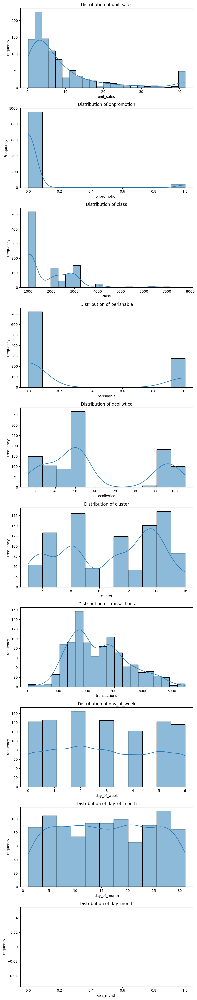

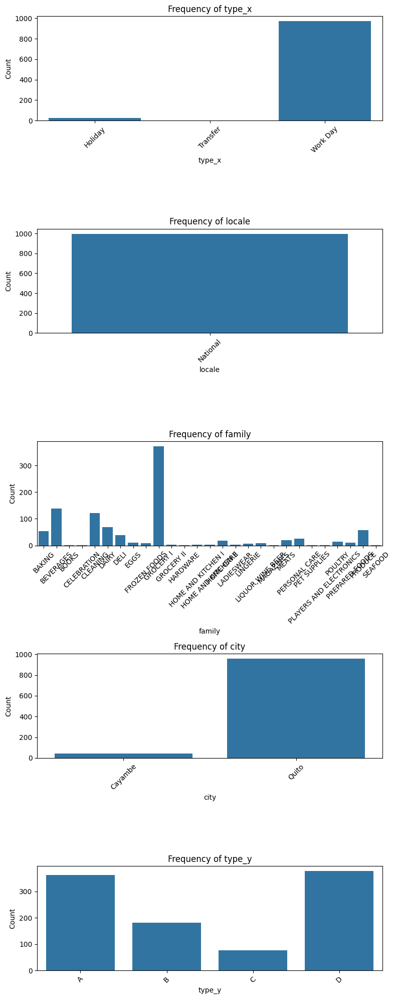

In [ ]:
numerical_columns = df.select_dtypes(include=['number']).columns
categorical_columns = df.select_dtypes(include=['category']).columns

# Exclude columns containing the '_id' wildcard and specific identifier columns
columns_to_exclude = ['id', 'item_nbr', 'store_nbr']
numerical_columns = [
    column for column in numerical_columns if '_id' not in column and column not in columns_to_exclude
]

# Create subplots for numerical columns (histograms)
fig_numerical, axes_numerical = plt.subplots(len(numerical_columns), 1, figsize=(8, len(numerical_columns)*4))

for i, numerical in enumerate(numerical_columns):
    ax = axes_numerical[i] if len(numerical_columns) > 1 else axes_numerical
    sns.histplot(data=df, x=numerical, kde=True, ax=ax)
    ax.set_title(f'Distribution of {numerical}')
    ax.set_xlabel(numerical)
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

# Create subplots for categorical columns (count plots)
fig_categorical, axes_categorical = plt.subplots(len(categorical_columns), 1, figsize=(8, len(categorical_columns)*4))

for i, categorical in enumerate(categorical_columns):
    ax = axes_categorical[i] if len(categorical_columns) > 1 else axes_categorical
    sns.countplot(data=df, x=categorical, ax=ax)
    ax.set_title(f'Frequency of {categorical}')
    ax.set_xlabel(categorical)
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=45) # Rotate labels for better readability

plt.tight_layout()
plt.show()

#### 2.2.1.2. Box and Violin Plots

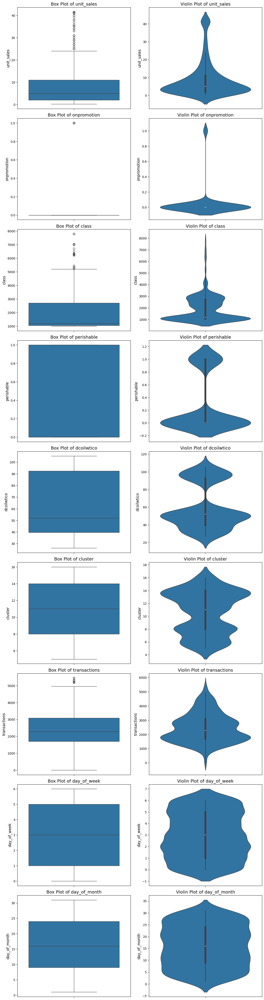

In [ ]:
# Filter numerical columns to exclude those with all NaN values in the sampled df
numerical_columns_to_plot = [col for col in numerical_columns if not df[col].dropna().empty]

num_numerical_to_plot = len(numerical_columns_to_plot)

if num_numerical_to_plot == 0:
    print("No numerical columns with valid (non-NaN) data found for box and violin plots after filtering.")
else:
    # Create subplots: num_numerical_to_plot rows, 2 columns (one for box, one for violin)
    # The total figure height scales with the number of plots.
    fig, axes = plt.subplots(
        nrows=num_numerical_to_plot,
        ncols=2,
        figsize=(12, num_numerical_to_plot * 5),
        squeeze=False  # Ensures 'axes' is always a 2D array, even with one row
    )

    # 3. Loop and plot
    for i, numerical in enumerate(numerical_columns_to_plot):
        # --- Box Plot (in the first column of the current row) ---
        ax_box = axes[i, 0]  # Correct index: row 'i', column 0
        sns.boxplot(data=df, y=numerical, ax=ax_box)
        ax_box.set_title(f'Box Plot of {numerical}', fontsize=14)
        ax_box.set_ylabel(numerical, fontsize=12)
        ax_box.set_xlabel('') # Clear the x-label as there is no category

        # --- Violin Plot (in the second column of the current row) ---
        ax_violin = axes[i, 1]  # Correct index: row 'i', column 1
        sns.violinplot(data=df, y=numerical, ax=ax_violin)
        ax_violin.set_title(f'Violin Plot of {numerical}', fontsize=14)
        ax_violin.set_ylabel(numerical, fontsize=12)
        ax_violin.set_xlabel('') # Clear the x-label as there is no category

    # 4. Final adjustments
    plt.tight_layout()
    plt.show()

#### 2.2.1.3. Line Graphs

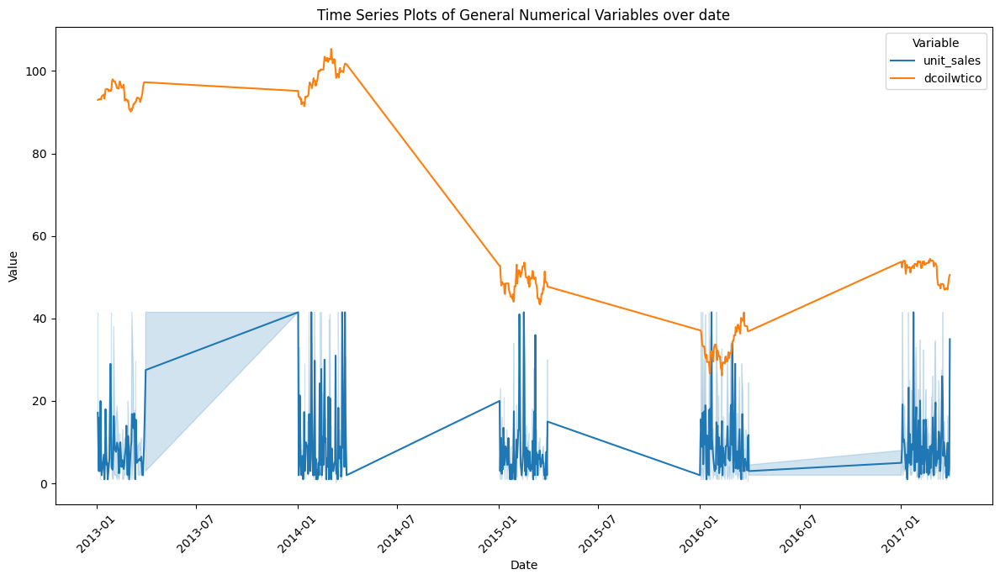

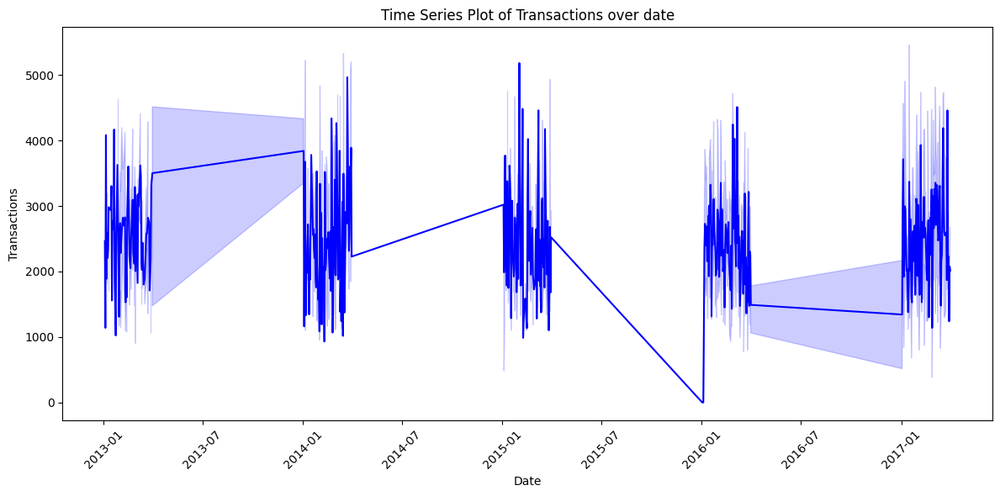

In [ ]:
time_column = None
# List of common time-related column names, from largest to smallest granularity
priority_time_columns = [
    'datetime', 'date', 'timestamp', 'time'
]
split_time = [
    'year', 'month', 'day', 'hour', 'minute', 'second', 'millisecond'
]

# Automatically detect the time column if not specified

for col in priority_time_columns:
  if col in df.columns:
    time_column = col

# Ensure the detected time column is of a datetime type for proper plotting
# This conversion can handle various string formats
df[time_column] = pd.to_datetime(df[time_column])

# Define columns to exclude from the main line plot
columns_to_exclude_from_general_plot = ['onpromotion', 'class', 'perishable', 'cluster', 'transactions']

# Filter numerical columns for the general line plot
numerical_columns_for_general_plot = ['unit_sales', 'dcoilwtico']

# Melt the DataFrame to long format for easier plotting with seaborn for general variables
if numerical_columns_for_general_plot:
    df_long_general = df.melt(id_vars=[time_column], value_vars=numerical_columns_for_general_plot,
                              var_name='Variable', value_name='Value')

    # Create the general line plot
    plt.figure(figsize=(12, 7)) # A more standard and professional figure size
    sns.lineplot(data=df_long_general, x=time_column, y='Value', hue='Variable', palette='tab10')

    # Add titles and labels
    plt.title(f'Time Series Plots of General Numerical Variables over {time_column}')
    plt.xlabel(time_column.title()) # Capitalize the first letter for a cleaner look
    plt.ylabel('Value')

    # Improve layout
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
else:
    print("No general numerical columns left to plot after exclusion.")

# Create a separate line plot for 'transactions'
if 'transactions' in df.columns:
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df, x=time_column, y='transactions', color='blue')
    plt.title(f'Time Series Plot of Transactions over {time_column}')
    plt.xlabel(time_column.title())
    plt.ylabel('Transactions')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
else:
    print("The 'transactions' column was not found in the DataFrame.")

In [ ]:
# Define the numerical columns for which to plot the average year trend
numerical_cols_for_average_general = ['unit_sales', 'dcoilwtico']
numerical_cols_for_average_transactions = ['transactions']

# Group by day_month and calculate the mean for the selected numerical columns
df_average_year = df.groupby('day_month')[numerical_cols_for_average_general + numerical_cols_for_average_transactions].mean().reset_index()

# Check if df_average_year is empty
if df_average_year.empty:
    print("Warning: df_average_year is empty. No yearly trend plots can be generated.")
else:
    # Convert 'day_month' back to a datetime object for proper sorting on the x-axis
    # Use a dummy year (e.g., 2000) to create a sortable date
    df_average_year['date_for_sort'] = pd.to_datetime('2000-' + df_average_year['day_month'].astype(str))

    # Sort by this new date column
    df_average_year = df_average_year.sort_values('date_for_sort')

    # --- Plot for unit_sales and dcoilwtico ---
    # Melt the DataFrame for unit_sales and dcoilwtico
    df_average_year_long_general = df_average_year.melt(
        id_vars=['date_for_sort'],
        value_vars=numerical_cols_for_average_general,
        var_name='Variable',
        value_name='Average Value'
    )

    plt.figure(figsize=(14, 7))
    sns.lineplot(data=df_average_year_long_general, x='date_for_sort', y='Average Value', hue='Variable', palette='tab10')

    plt.title('Average Yearly Trends for Unit Sales and Dcoilwtico')
    plt.xlabel('Day of Year')
    plt.ylabel('Average Value')

    import matplotlib.dates as mdates
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    plt.xticks(rotation=45, ha='right')

    plt.tight_layout()
    plt.show()

    # --- Plot for transactions ---
    # Melt the DataFrame for transactions
    df_average_year_long_transactions = df_average_year.melt(
        id_vars=['date_for_sort'],
        value_vars=numerical_cols_for_average_transactions,
        var_name='Variable',
        value_name='Average Value'
    )

    plt.figure(figsize=(14, 6))
    sns.lineplot(data=df_average_year_long_transactions, x='date_for_sort', y='Average Value', hue='Variable', palette='tab10')

    plt.title('Average Yearly Trends for Transactions')
    plt.xlabel('Day of Year')
    plt.ylabel('Average Value')

    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    plt.xticks(rotation=45, ha='right')

    plt.tight_layout()
    plt.show()

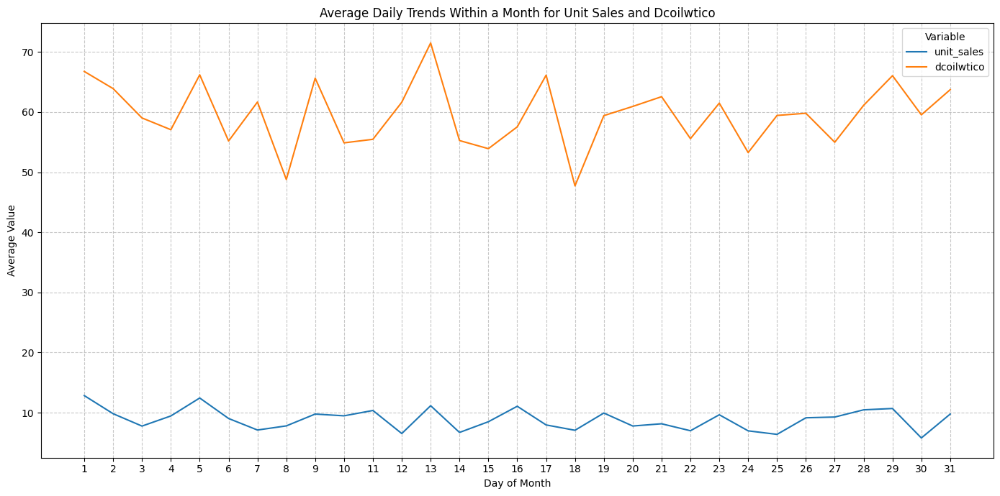

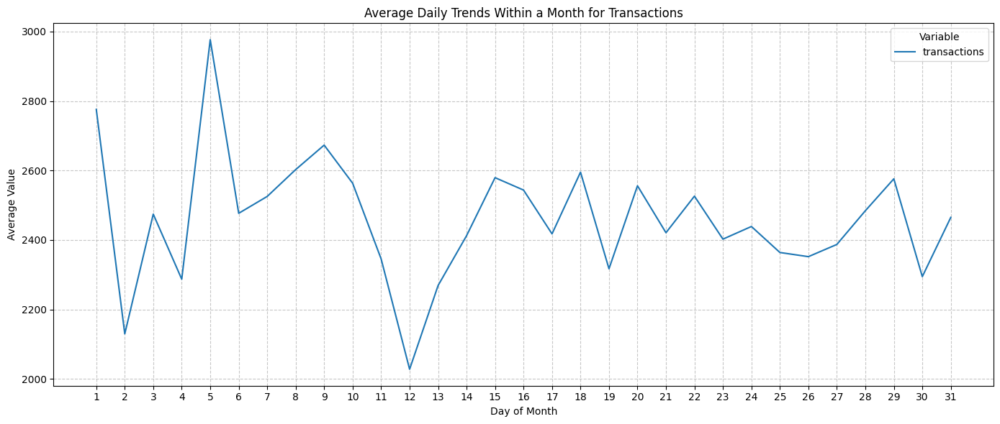

In [ ]:
# Define the numerical columns for which to plot the average day-of-month trend
numerical_cols_for_average_general_day_of_month = ['unit_sales', 'dcoilwtico']
numerical_cols_for_average_transactions_day_of_month = ['transactions']

# Group by day_of_month and calculate the mean for the selected numerical columns
df_average_day_of_month = df.groupby('day_of_month')[numerical_cols_for_average_general_day_of_month + numerical_cols_for_average_transactions_day_of_month].mean().reset_index()

# --- Plot for unit_sales and dcoilwtico (average day of month) ---
# Melt the DataFrame for unit_sales and dcoilwtico
df_average_day_of_month_long_general = df_average_day_of_month.melt(
    id_vars=['day_of_month'],
    value_vars=numerical_cols_for_average_general_day_of_month,
    var_name='Variable',
    value_name='Average Value'
)

plt.figure(figsize=(14, 7))
sns.lineplot(data=df_average_day_of_month_long_general, x='day_of_month', y='Average Value', hue='Variable', palette='tab10')

plt.title('Average Daily Trends Within a Month for Unit Sales and Dcoilwtico')
plt.xlabel('Day of Month')
plt.ylabel('Average Value')
plt.xticks(range(1, 32)) # Assuming a max of 31 days in a month
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# --- Plot for transactions (average day of month) ---
# Melt the DataFrame for transactions
df_average_day_of_month_long_transactions = df_average_day_of_month.melt(
    id_vars=['day_of_month'],
    value_vars=numerical_cols_for_average_transactions_day_of_month,
    var_name='Variable',
    value_name='Average Value'
)

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_average_day_of_month_long_transactions, x='day_of_month', y='Average Value', hue='Variable', palette='tab10')

plt.title('Average Daily Trends Within a Month for Transactions')
plt.xlabel('Day of Month')
plt.ylabel('Average Value')
plt.xticks(range(1, 32)) # Assuming a max of 31 days in a month
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

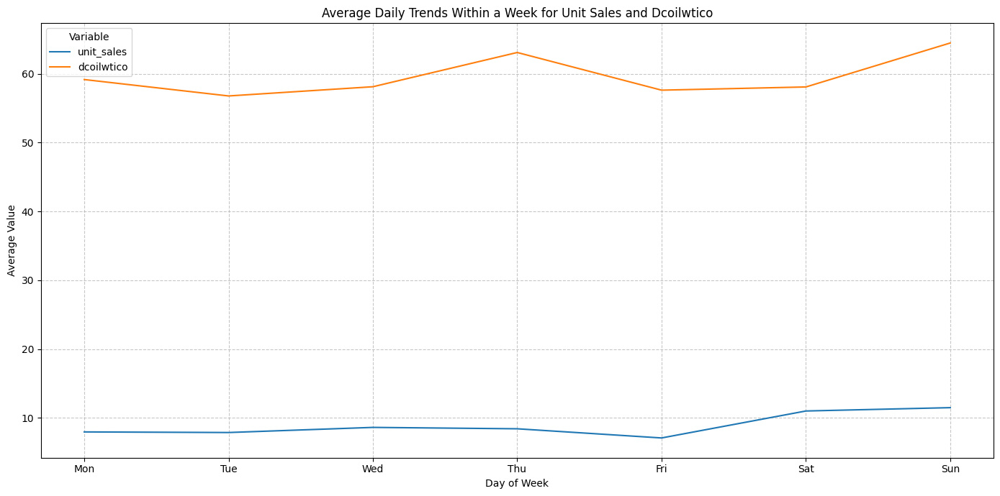

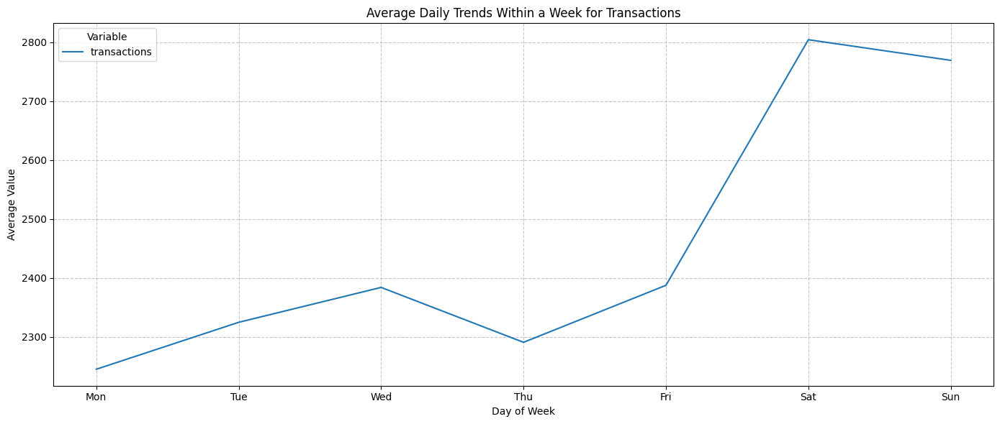

In [ ]:
# Define the numerical columns for which to plot the average day-of-week trend
numerical_cols_for_average_general_day_of_week = ['unit_sales', 'dcoilwtico']
numerical_cols_for_average_transactions_day_of_week = ['transactions']

# Group by day_of_week and calculate the mean for the selected numerical columns
df_average_day_of_week = df.groupby('day_of_week')[numerical_cols_for_average_general_day_of_week + numerical_cols_for_average_transactions_day_of_week].mean().reset_index()

# --- Plot for unit_sales and dcoilwtico (average day of week) ---
# Melt the DataFrame for unit_sales and dcoilwtico
df_average_day_of_week_long_general = df_average_day_of_week.melt(
    id_vars=['day_of_week'],
    value_vars=numerical_cols_for_average_general_day_of_week,
    var_name='Variable',
    value_name='Average Value'
)

plt.figure(figsize=(14, 7))
sns.lineplot(data=df_average_day_of_week_long_general, x='day_of_week', y='Average Value', hue='Variable', palette='tab10')

plt.title('Average Daily Trends Within a Week for Unit Sales and Dcoilwtico')
plt.xlabel('Day of Week')
plt.ylabel('Average Value')
plt.xticks(range(7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# --- Plot for transactions (average day of week) ---
# Melt the DataFrame for transactions
df_average_day_of_week_long_transactions = df_average_day_of_week.melt(
    id_vars=['day_of_week'],
    value_vars=numerical_cols_for_average_transactions_day_of_week,
    var_name='Variable',
    value_name='Average Value'
)

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_average_day_of_week_long_transactions, x='day_of_week', y='Average Value', hue='Variable', palette='tab10')

plt.title('Average Daily Trends Within a Week for Transactions')
plt.xlabel('Day of Week')
plt.ylabel('Average Value')
plt.xticks(range(7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 2.2.2. Bivariate Analysis

#### 2.2.2.1. Scatter PLots

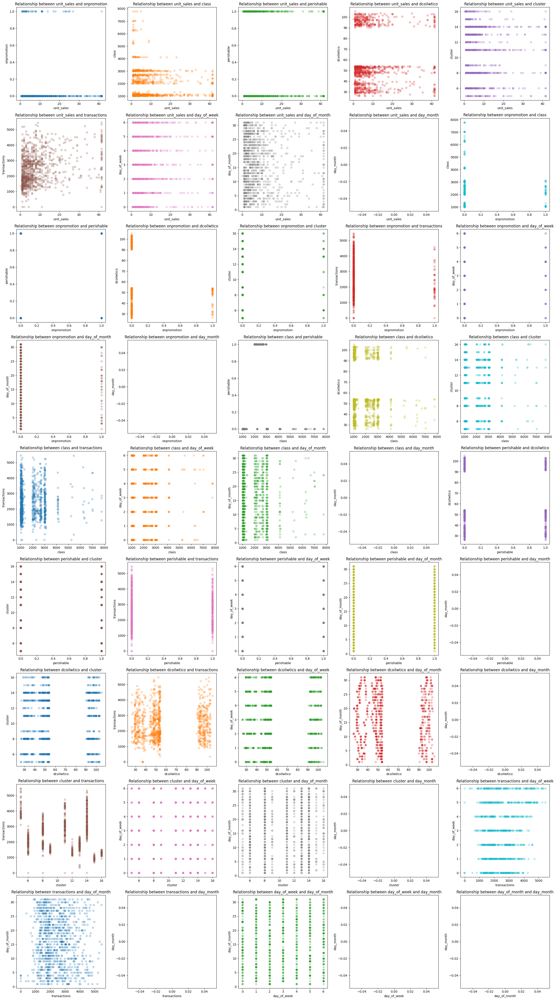

In [ ]:
numerical_df = df.select_dtypes(include=np.number)

# Filter for the relevant columns
relevant_columns = ['unit_sales', 'onpromotion', 'perishable', 'dcoilwtico', 'transactions']
numerical_df = numerical_df[relevant_columns]

column_pairs = list(combinations(numerical_columns, 2))

fig, axes = plt.subplots(ceil(len(column_pairs)/5), 5, figsize=(25, 5*ceil(len(column_pairs)/5)))
axes_flat = axes.flatten()

colors = sns.color_palette('tab10', len(column_pairs))

# Loop through each subplot axis and the corresponding column pair
# zip() is a concise way to iterate over both lists at the same time
for ax, (col1, col2), color in zip(axes_flat, column_pairs, colors):
    ax.scatter(df[col1], df[col2], alpha=0.25, color=color)

    ax.set_xlabel(col1)
    ax.set_ylabel(col2)
    ax.set_title(f"Relationship between {col1} and {col2}")

plt.tight_layout()
plt.show()

#### 2..2.2. Correlation Matrix

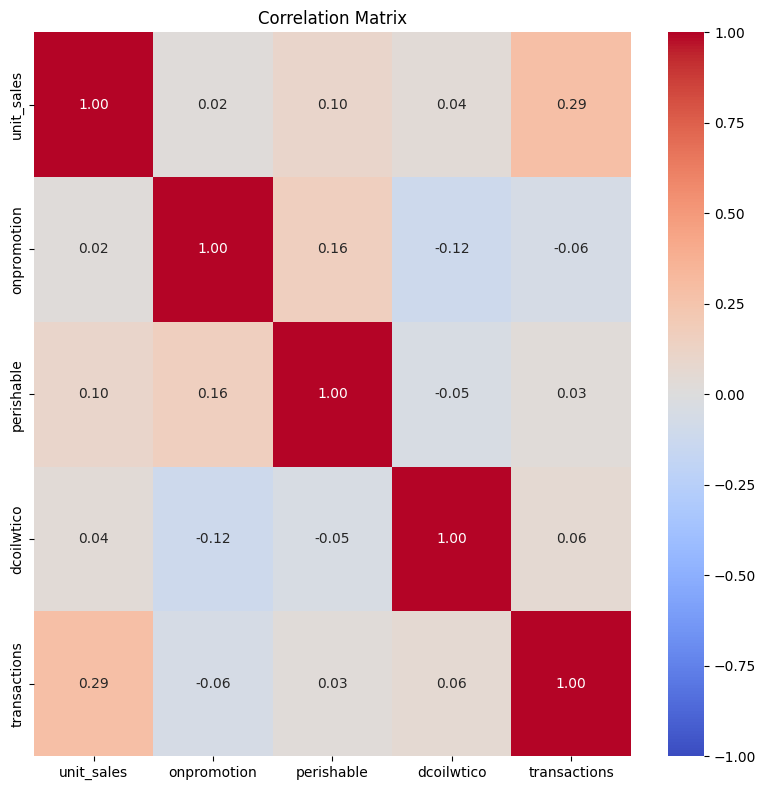


Correlation Matrix:


,unit_sales,onpromotion,perishable,dcoilwtico,transactions
unit_sales,1.000000,0.018350,0.100994,0.036338,0.288702
onpromotion,0.018350,1.000000,0.162508,-0.115391,-0.056993
perishable,0.100994,0.162508,1.000000,-0.046369,0.027076
dcoilwtico,0.036338,-0.115391,-0.046369,1.000000,0.058159
transactions,0.288702,-0.056993,0.027076,0.058159,1.000000


In [ ]:
corr = numerical_df.corr()
plt.figure(figsize=(8, 8))

# Calculate the maximum absolute correlation value to set symmetric vmin and vmax
max_abs_corr = np.max(np.abs(corr.values))

sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10},
            vmin=-max_abs_corr, vmax=max_abs_corr, center=0)

plt.title('Correlation Matrix')
plt.tight_layout()

plt.show()

print("\nCorrelation Matrix:")
display(corr)

#### 2.2.2.3. Box and Violin Plots over category

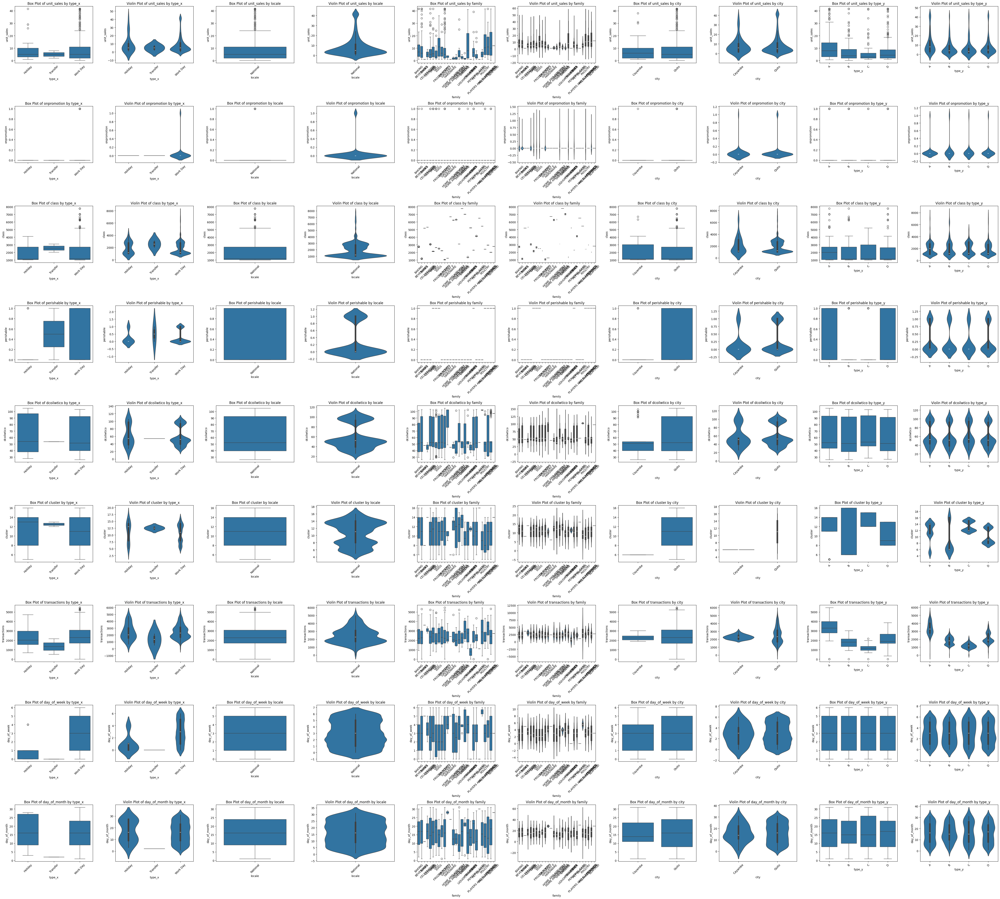

In [ ]:
categorical_columns = df.select_dtypes(include=['object', 'category']).columns

categorical_columns = [
    column for column in categorical_columns if '_id' not in column
]

# Re-define numerical_columns for consistency with previous plots and to exclude identifiers
numerical_columns_for_bivariate = df.select_dtypes(include=['number']).columns
columns_to_exclude_bivariate = ['id', 'item_nbr', 'store_nbr']
numerical_columns_for_bivariate = [
    column for column in numerical_columns_for_bivariate if '_id' not in column and column not in columns_to_exclude_bivariate
]
# Filter to ensure they have at least one non-NaN value somewhere in the df
numerical_columns_for_bivariate = [col for col in numerical_columns_for_bivariate if not df[col].dropna().empty]

num_numerical = len(numerical_columns_for_bivariate)
num_categorical = len(categorical_columns)

if num_numerical == 0 or num_categorical == 0:
    print("No numerical or categorical columns found for box and violin plots.")
else:
    fig, axes = plt.subplots(num_numerical, num_categorical * 2, figsize=(num_categorical * 10, num_numerical * 5), squeeze=False)

    for i, numerical in enumerate(numerical_columns_for_bivariate):
        for j, category in enumerate(categorical_columns):
            # Filter data to only include rows where both numerical and categorical columns have non-null values
            plot_data = df.dropna(subset=[numerical, category])

            if not plot_data.empty:
                # Box plot
                ax_box = axes[i, j * 2]
                sns.boxplot(data=plot_data, x=category, y=numerical, ax=ax_box)
                ax_box.set_title(f'Box Plot of {numerical} by {category}')
                ax_box.set_xlabel(category)
                ax_box.set_ylabel(numerical)
                ax_box.tick_params(axis='x', rotation=45)

                # Violin plot
                ax_violin = axes[i, j * 2 + 1]
                sns.violinplot(data=plot_data, x=category, y=numerical, ax=ax_violin)
                ax_violin.set_title(f'Violin Plot of {numerical} by {category}')
                ax_violin.set_xlabel(category)
                ax_violin.set_ylabel(numerical)
                ax_violin.tick_params(axis='x', rotation=45)
            else:
                # If no valid data for plotting this pair, display a message instead of an empty plot
                ax_box = axes[i, j * 2]
                ax_box.axis('off')
                ax_box.text(0.5, 0.5, f'No valid data for {numerical} by {category}',
                            horizontalalignment='center', verticalalignment='center', transform=ax_box.transAxes)

                ax_violin = axes[i, j * 2 + 1]
                ax_violin.axis('off')
                ax_violin.text(0.5, 0.5, f'No valid data for {numerical} by {category}',
                               horizontalalignment='center', verticalalignment='center', transform=ax_violin.transAxes)

    plt.tight_layout()
    plt.show()

# 3. Save Data Frames as CSV

## 3.0. Information about Aggregation

In [ ]:
df_csv = df_complete.copy()

In [ ]:
df_csv.columns

Index(['date', 'item_nbr', 'unit_sales', 'onpromotion', 'type_x', 'locale',
       'transferred', 'family', 'class', 'perishable', 'dcoilwtico', 'city',
       'type_y', 'cluster', 'transactions', 'day_of_week', 'day_of_month',
       'day_month'],
      dtype='object')

In [ ]:
df_csv['type_y'].unique()

Dask Series Structure:
npartitions=78
    string
       ...
     ...  
       ...
       ...
Dask Name: unique, 135 expressions
Expr=Unique(frame=(Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Filter(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Drop(frame=Merge(a574a4f), columns=['id', 'store_nbr', 'locale_name', 'description', 'state']))))))))))))))))))))))), predicate=Between(frame=PropertyMap(frame=(Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Ass

In [ ]:
df_csv['class'].unique()

Dask Series Structure:
npartitions=78
    int64
      ...
    ...  
      ...
      ...
Dask Name: unique, 135 expressions
Expr=Unique(frame=(Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Filter(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Drop(frame=Merge(a574a4f), columns=['id', 'store_nbr', 'locale_name', 'description', 'state']))))))))))))))))))))))), predicate=Between(frame=PropertyMap(frame=(Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(frame=Assign(f

In [ ]:
families = df_csv['family'].unique().compute()


In [ ]:
for fam in families:
  if '/' in fam:
    print(fam)

In [ ]:
len(df_csv['item_nbr'].unique())

3922

In [ ]:
df_items.head()

,item_nbr,family,class,perishable
0,96995,GROCERY I,1093,0
1,99197,GROCERY I,1067,0
2,103501,CLEANING,3008,0
3,103520,GROCERY I,1028,0
4,103665,BAKING,2712,1


In [ ]:
unique_items_per_family = df_csv.groupby('family')['item_nbr'].nunique().reset_index()
unique_items_per_family = unique_items_per_family.rename(columns={'item_nbr': 'unique_items'})
sorted_families = unique_items_per_family.sort_values(by='unique_items', ascending=False)
top_10_families = sorted_families.head(10)
print(top_10_families)

          family  unique_items
0      GROCERY I          1244
0      BEVERAGES           584
0       CLEANING           440
0        PRODUCE           305
0          DAIRY           236
0  PERSONAL CARE           153
0         BAKING           134
1      HOME CARE           104
0           DELI            91
0          MEATS            83


## 3.1. Save Data Frame

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Define the target directory in Google Drive
output_dir = '/content/drive/My Drive/datasources/Time Series'

# Create the directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

def sanitize_filename(filename):
    """Remove or replace characters that are invalid in filenames."""
    # Replace common problematic characters
    filename = re.sub(r'[<>:"/\\|?*]', '_', filename)
    # Remove leading/trailing spaces and dots
    filename = filename.strip('. ')
    # Limit length to avoid filesystem issues
    return filename[:200]

# Save the complete DataFrame
output_filepath = os.path.join(output_dir, 'all.csv')
if os.path.exists(output_filepath):
    os.remove(output_filepath)
df_csv.to_csv(output_filepath, index=False, single_file=True)
"""
# Create data frame of type_y
print("Processing type_y categories...")
for tp in df_csv['type_y'].unique().compute():
    safe_name = sanitize_filename(str(tp))
    category_df = df_csv[df_csv['type_y'] == tp]
    output_filepath = os.path.join(output_dir, f'{safe_name}.csv')
    if os.path.exists(output_filepath):
        os.remove(output_filepath)
    category_df.to_csv(output_filepath, index=False, single_file=True)
    print(f"  Saved: {safe_name}.csv")
"""
# Create data frames of family
print("Processing family categories...")
for category in df_csv['family'].unique().compute():
    safe_name = sanitize_filename(str(category))
    item_df = df_csv[df_csv['family'] == category]
    output_filepath = os.path.join(output_dir, f'{safe_name}.csv')
    if os.path.exists(output_filepath):
        os.remove(output_filepath)
    item_df.to_csv(output_filepath, index=False, single_file=True)
    print(f"  Saved: {safe_name}.csv")
"""
# create data frames of class
for cls in df_csv['class'].unique():
  item_df = df_csv[df_csv['class'] == cls]
  output_filepath = os.path.join(output_dir, f'{cls}.csv')
  item_df.to_csv(output_filepath, index=False)
"""
"""
# create data frames of items
for item in ddf_csvf['item_nbr'].unique():
  item_df = df_csv[df_csv['item_nbr'] == item]
  output_filepath = os.path.join(output_dir, f'{item}.csv')
  item_df.to_csv(output_filepath, index=False)
"""

Mounted at /content/drive
Processing family categories...
  Saved: HOME APPLIANCES.csv
  Saved: BEAUTY.csv
  Saved: BEVERAGES.csv
  Saved: DELI.csv
  Saved: AUTOMOTIVE.csv
  Saved: DAIRY.csv
  Saved: PET SUPPLIES.csv
  Saved: HOME AND KITCHEN II.csv
  Saved: BAKING.csv
  Saved: MEATS.csv
  Saved: LIQUOR,WINE,BEER.csv


In [ ]:
# Uploading a file with every file option with actual data

# create list of valuess
list_of_columns = ['type_y', 'family', 'class', 'item_nbr']

for col in list_of_columns:
  # converting the list of unique names to df
  name_dict = {col: df_csv[col].unique()}
  df_of_names = pd.DataFrame(name_dict)

  # upload
  output_filepath = os.path.join(output_dir, f'{col}_names.csv')
  df_of_names.to_csv(output_filepath, index=False)
